# Learning Functions Part 2

In this notebook we'll learn simple functions over sequences of numbers.

In [1]:
# Load environment
using Pkg
Pkg.activate("..")

"/Users/domluna/github/NeuralArithmetic/Project.toml"

In [2]:
using NeuralArithmetic
using Flux
using Plots
using DataFrames

┌ Info: Precompiling NeuralArithmetic [77cec1ae-a0aa-11e8-15c8-b1760286d022]
└ @ Base loading.jl:1186


loaded


In [3]:
# number of training set examples
N = 500

500

The dataset of a function will contain `N` training examples, 50 validation examples (interpolation), and 50 testing examples (extrapolation).

In [4]:
# N sequences of length 1 to 10
train_seqs = rand.(rand(10:10, N)) 
# (interpolation)
val_seqs = rand.(rand(10:10, 50))
# (extrapolation) sequences longer than shown
test_seqs = rand.(rand(1000:1000, 50))

50-element Array{Array{Float64,1},1}:
 [0.073378, 0.284954, 0.632867, 0.0778558, 0.0647435, 0.391197, 0.167934, 0.162378, 0.355973, 0.249072  …  0.536125, 0.305135, 0.968581, 0.34923, 0.499337, 0.348764, 0.743945, 0.441066, 0.175318, 0.236027]   
 [0.207697, 0.638615, 0.222169, 0.212123, 0.897906, 0.347844, 0.687152, 0.419488, 0.0590168, 0.56675  …  0.804964, 0.862921, 0.591506, 0.0234006, 0.741115, 0.550906, 0.565493, 0.403464, 0.333815, 0.814399]   
 [0.7024, 0.60866, 0.785311, 0.603793, 0.0145886, 0.321973, 0.549829, 0.564334, 0.805805, 0.317421  …  0.824177, 0.965072, 0.364675, 0.47035, 0.49924, 0.0648404, 0.454995, 0.195796, 0.459447, 0.53588]        
 [0.830521, 0.196764, 0.198967, 0.7409, 0.0247188, 0.648943, 0.970222, 0.648595, 0.623818, 0.0518667  …  0.722147, 0.450617, 0.684354, 0.767236, 0.337408, 0.40604, 0.471326, 0.146941, 0.98076, 0.502678]      
 [0.714713, 0.0155772, 0.704735, 0.583939, 0.738486, 0.975677, 0.339542, 0.421398, 0.876742, 0.206748  …  0.910269, 0.996884, 

Recurrent NAC/NALU cells

In [5]:
function f(m, x)
    state = m[1].(x)[end]
    # reset hidden state of recurrent node on each sequence
    Flux.reset!(m[1])
    m[2:end](state)
end

loss(f, m) = (x, y) -> Flux.mse(f(m, x), y)

function train_model(lossf, opt, data, epochs::Int, print_interval::Int)
    hist = zeros(epochs)
    for i in 1:epochs
        Flux.train!(lossf, data, opt)
        train_loss = Flux.data(sum(lossf(d...) for d in data[1:50]))
        if print_interval != -1 && i % print_interval == 0
            @info "Iteration $i, training loss = $train_loss"
        end
        hist[i] = train_loss
    end
    return hist
end

train_model (generic function with 1 method)

Let's run the experiments and plot results.

In [6]:
epochs = 500
print_interval = 50

50

### `+` Data

In [7]:
add_data_train = [(s, reduce(+, s)) for s in train_seqs]
add_data_val = [(s, reduce(+, s)) for s in val_seqs]
add_data_test = [(s, reduce(+, s)) for s in test_seqs];

## `LSTM + Dense`

┌ Info: Iteration 50, training loss = 0.14179318608900238
└ @ Main In[5]:16
┌ Info: Iteration 100, training loss = 0.027525154682833414
└ @ Main In[5]:16
┌ Info: Iteration 150, training loss = 0.04296780813430164
└ @ Main In[5]:16
┌ Info: Iteration 200, training loss = 0.03542752605605358
└ @ Main In[5]:16
┌ Info: Iteration 250, training loss = 0.025363612985865005
└ @ Main In[5]:16
┌ Info: Iteration 300, training loss = 0.01825820294759951
└ @ Main In[5]:16
┌ Info: Iteration 350, training loss = 0.014629277067811914
└ @ Main In[5]:16
┌ Info: Iteration 400, training loss = 0.013177312026958031
└ @ Main In[5]:16
┌ Info: Iteration 450, training loss = 0.01229535402719929
└ @ Main In[5]:16
┌ Info: Iteration 500, training loss = 0.01294237313391829
└ @ Main In[5]:16
┌ Info: ("Validation loss", 0.011150454411155128)
└ @ Main In[11]:5
┌ Info: ("Test loss", 1.1917295211705035e7)
└ @ Main In[11]:6


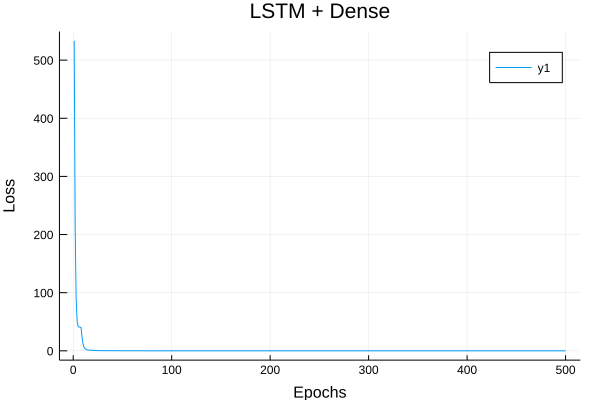

In [11]:
lstm = Chain(LSTM(1, 2), Dense(2, 1))
lstm_opt = ADAM(params(lstm))
lstm_loss = loss(f, lstm)
hist = train_model(lstm_loss, lstm_opt, add_data_train, epochs, print_interval)
@info "Validation loss", sum(lstm_loss(d...) for d in add_data_val) |> Flux.data
@info "Test loss", sum(lstm_loss(d...) for d in add_data_test) |> Flux.data
plot(hist, title="LSTM + Dense", xlabel="Epochs", ylabel="Loss")

## `RNAC`

┌ Info: Iteration 50, training loss = 5.530179835952312e-19
└ @ Main In[5]:16
┌ Info: Iteration 100, training loss = 3.2537744253258556e-15
└ @ Main In[5]:16
┌ Info: Iteration 150, training loss = 1.66692544325078e-7
└ @ Main In[5]:16
┌ Info: Iteration 200, training loss = 4.040720496702947e-21
└ @ Main In[5]:16
┌ Info: Iteration 250, training loss = 3.0666967690466834e-28
└ @ Main In[5]:16
┌ Info: Iteration 300, training loss = 3.465406557869534e-9
└ @ Main In[5]:16
┌ Info: Iteration 350, training loss = 8.757473099084667e-18
└ @ Main In[5]:16
┌ Info: Iteration 400, training loss = 3.876446364925521e-17
└ @ Main In[5]:16
┌ Info: Iteration 450, training loss = 6.799586572552511e-27
└ @ Main In[5]:16
┌ Info: Iteration 500, training loss = 2.938098985874619e-6
└ @ Main In[5]:16
┌ Info: ("Validation loss", 5.8808940795033265e-8)
└ @ Main In[9]:5
┌ Info: ("Test loss", 274.36775381923877)
└ @ Main In[9]:6


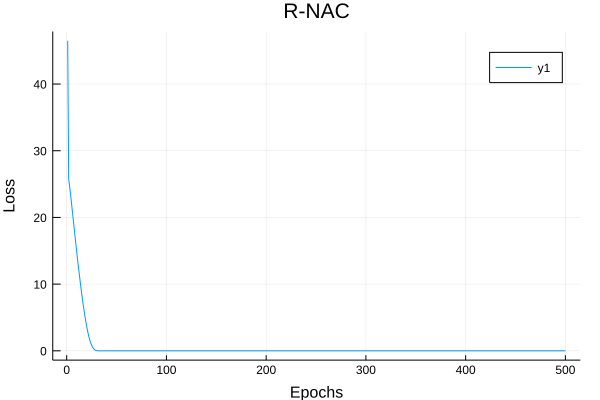

In [9]:
rnac = Chain(RNAC(1, 2), NAC(2, 1))
rnac_opt = ADAM(params(rnac))
rnac_loss = loss(f, rnac)
hist = train_model(rnac_loss, rnac_opt, add_data_train, epochs, print_interval)
@info "Validation loss", Flux.data(sum(rnac_loss(d...) for d in add_data_val) / length(add_data_val))
@info "Test loss", Flux.data(sum(rnac_loss(d...) for d in add_data_test) / length(add_data_test))
plot(hist, title="R-NAC", xlabel="Epochs", ylabel="Loss")

## `RNALU`

┌ Info: Iteration 50, training loss = 0.5157459816248404
└ @ Main In[5]:16
┌ Info: Iteration 100, training loss = 0.026475977554615684
└ @ Main In[5]:16
┌ Info: Iteration 150, training loss = 0.007385885267410058
└ @ Main In[5]:16
┌ Info: Iteration 200, training loss = 0.0067208348490605425
└ @ Main In[5]:16
┌ Info: Iteration 250, training loss = 0.006605648149593228
└ @ Main In[5]:16
┌ Info: Iteration 300, training loss = 0.0064672052892602765
└ @ Main In[5]:16
┌ Info: Iteration 350, training loss = 0.006327577028233379
└ @ Main In[5]:16
┌ Info: Iteration 400, training loss = 0.006192492415650234
└ @ Main In[5]:16
┌ Info: Iteration 450, training loss = 0.00606140878657894
└ @ Main In[5]:16
┌ Info: Iteration 500, training loss = 0.005932669617296813
└ @ Main In[5]:16
┌ Info: ("Validation loss", 8.941076272801248e-5)
└ @ Main In[12]:5
┌ Info: ("Test loss", 10264.974893428716)
└ @ Main In[12]:6


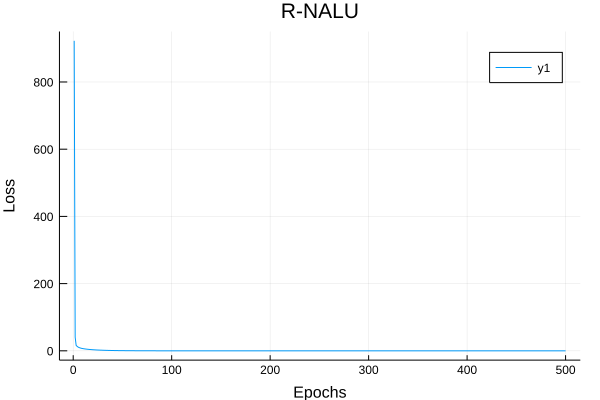

In [12]:
rnalu = Chain(RNALU(1, 2), NAC(2, 1))
rnalu_opt = ADAM(params(rnalu))
rnalu_loss = loss(f, rnalu)
hist = train_model(rnalu_loss, rnalu_opt, add_data_train, epochs, print_interval)
@info "Validation loss", Flux.data(sum(rnalu_loss(d...) for d in add_data_val) / length(add_data_val))
@info "Test loss", Flux.data(sum(rnalu_loss(d...) for d in add_data_test) / length(add_data_test))
plot(hist, title="R-NALU", xlabel="Epochs", ylabel="Loss")

Notice `RNAC` and `RNALU` both have a significantly lower test loss score than the `LSTM` while the validation scores are similar. This implies `RNAC` and `RNALU` generalize to longer sequences much better than the `LSTM`.